## Initialize environment

In [6]:
import sys
import shutil
import os
import gc
import tqdm
import torch
import random
import pandas as pd
import numpy as np
import anndata as ad
import argparse
import glob
import torchvision
import scprep as scp
import warnings
import torch.nn as nn
import json
import seaborn as sns
import scanpy as sc
import squidpy as sq
import hdf5plugin
import torchstain
import pytorch_lightning as pl
import matplotlib.pyplot as plt
import torch.optim as optim
import scanpy as sc
import numpy as np


# Add relative path
sys.path.append("../")
from PIL import Image
from torch.utils.data import Dataset, DataLoader
from sklearn.preprocessing import LabelEncoder
from torch_geometric import utils
from torch_geometric.utils import from_scipy_sparse_matrix
from scipy.sparse import csr_matrix
from scipy.sparse import coo_matrix
from torchvision import transforms
from squidpy.im import ImageContainer
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import pearsonr
from scipy.spatial import distance_matrix, minkowski_distance, distance
from typing import Union, Dict, Optional, Tuple, BinaryIO
from pathlib import Path, PurePath
from matplotlib.image import imread
from collections import defaultdict as dfd
from sklearn.neighbors import kneighbors_graph
from torch.utils.data import DataLoader
from pytorch_lightning import seed_everything
from Models.DeepPT.deeppt import *
from Models.BLEEP.bleep import *
from Dataloader.Dataset import *

Image.MAX_IMAGE_PIXELS = None
warnings.filterwarnings("ignore")


In [7]:
dataset_name = "Blake_visium" 
hpc = "vmgpu" 
tmp_path = f"../Dataset/Blake_skin_visium"

if hpc =="wiener":
    abs_path = "/afm03/Q2/Q2051"
elif hpc == "vmgpu":
    abs_path = "/afm01/UQ/Q2051"
elif hpc == "bunya":
    abs_path = "/QRISdata/Q2051"

print("Dataset path:", abs_path)
print("Dataset_name:", dataset_name)
print("cluster:", hpc)

if hpc == "wiener":
    abs_path = "/afm03/Q2/Q2051/DeepHis2Exp/Models/Benchmarking_main"
    model_weight_path = "/afm03/Q2/Q2051/DeepHis2Exp/Model_Weights"
   #  model_weight_path = "/scratch/imb/uqyjia11/Yuanhao/DeepHis2Exp/Model_Weights"
    res_path = "/afm03/Q2/Q2051/DeepHis2Exp/Results"
    data_path = "/afm03/Q2/Q2051/DeepHis2Exp/Dataset"
elif hpc == "vmgpu":
    # abs_path = "/afm01/UQ/Q2051/DeepHis2Exp/Implementation"
    model_weight_path = "/afm01/UQ/Q2051/DeepHis2Exp/Model_Weights"
    res_path = "/afm01/UQ/Q2051/DeepHis2Exp/Results"
    data_path = "/afm01/UQ/Q2051/DeepHis2Exp/Dataset"

# Color normalization
# target = cv2.cvtColor(cv2.imread(f"{abs_path}/DeepHis2Exp/Dataset/Reference_Normalization/ref_HE.png"), cv2.COLOR_BGR2RGB)
def color_normalization(img, target=None, method="macenko"):
    """
    img: numpy array, RGB image
    method: str, "raw", "macenko" or "reinhard"
    target: numpy array, RGB image
    """

    T = transforms.Compose([
        transforms.ToTensor(),
        transforms.Resize(224),
        transforms.Lambda(lambda x: x*255)
    ])
    if method == "macenko":
        Normalizer = torchstain.normalizers.MacenkoNormalizer(backend='torch')
        Normalizer.fit(T(target))
        img, Macenko_H, Macenko_E = Normalizer.normalize(I=T(img), stains=True)
    elif method == "reinhard":
        Normalizer = torchstain.normalizers.ReinhardNormalizer(backend='torch')
        Normalizer.fit(T(target))
        img = Normalizer.normalize(I=T(img))
    elif method == "raw":
        img = img
    return img

def standard_ST_preprocessing(adata):
    # standard Scanpy clustering and umap workflow
    sc.pp.filter_cells(adata, min_genes=100)
    sc.pp.normalize_total(adata)
    sc.pp.log1p(adata)
    sc.pp.pca(adata)
    sc.pp.neighbors(adata)
    sc.tl.umap(adata)
    sc.tl.leiden(adata)
    sc.pp.highly_variable_genes(adata, n_top_genes=1000)
    return adata

def load_img_adata(adata_path, name):
    # Open the TIFF image using PIL
    image = Image.open(f"{adata_path}/{name}.tif")

    # Convert the PIL image to a numpy array
    img = np.array(image)

    # Load the adata
    adata = sc.read_h5ad(f"{adata_path}/{name}.h5ad")
    gc.collect()
    return adata, img

def pad_image(img, target_shape=(224, 224)):
    """
    Pad the input image to match the target shape.
    
    Args:
    - img: Input image (numpy array).
    - target_shape: Desired shape (height, width).
    
    Returns:
    - Padded image.
    """
    h, w = img.shape[:2]
    pad_height = max(0, target_shape[0] - h)
    pad_width = max(0, target_shape[1] - w)
    
    top = pad_height // 2
    bottom = pad_height - top
    left = pad_width // 2
    right = pad_width - left
    
    padded_img = cv2.copyMakeBorder(img, top, bottom, left, right, cv2.BORDER_CONSTANT, value=0)
    return padded_img

def crop_img(adata, name, img, adata_path, r=112):
    # crop patches
    n_patches = len(adata)
    patches = np.zeros((n_patches,2*r,2*r,3))
    for i in tqdm.tqdm(range(n_patches)):
        y, x = adata.obsm["spatial"].astype(int)[i]
        patches[i] = pad_image(img[x-r:x+r, y-r:y+r, :].astype(np.uint8))
        gc.collect()
    np.save(f"{adata_path}/{name}__patches{r}.npy", patches)
    gc.collect()
    return patches

# Image feature extraction
def FM_extract(name, patches, adata_path, model, image_processor):
    model.eval()
    model.cuda()
    patches_tensor = torch.tensor(patches, dtype=torch.float32).permute(0, 3, 1, 2)
    patch_embs = []
    for i in tqdm.tqdm(range(len(patches_tensor))):
        input = image_processor(patches_tensor[i], return_tensors="pt")
        input["pixel_values"] = input["pixel_values"].cuda()
        patch_embs.append(model(**input)[1].detach().cpu())
        gc.collect()
    patch_embs = torch.squeeze(torch.stack(patch_embs))
    torch.cuda.empty_cache()
    torch.save(patch_embs, f"{adata_path}/{name}__phikon_emb.pt")
    # torch.load(f"{adata_path}/{names[0]}__phikon_emb.pt").shape
    return patch_embs

def gene_plot(target_gene, sample, expression_values, pcc, 
              predicted, image, spatial_coords,):
    # Plot the image
    plt.figure(figsize=(10, 10))
    plt.imshow(image)

    # Plot the gene expression data
    plt.scatter(spatial_coords[:, 0], spatial_coords[:, 1], c=expression_values, cmap='viridis', s=12, alpha=0.5)
    plt.colorbar(label='Gene Expression')
    plt.xlabel('X')
    plt.ylabel('Y')
    if predicted:
        plt.title(f'Predicted gene expression: {target_gene}\nPearson correlation coefficient: {pcc.item():.2f}')
    else:
        plt.title(f'Observed gene expression: {target_gene}')
    plt.axis('off')
    if predicted:
        plt.savefig(f"pred_{sample}_{target_gene}.pdf")
    else:
        plt.savefig(f"obs_{sample}_{target_gene}.pdf")
    plt.show()
    gc.collect()


Dataset path: /afm01/UQ/Q2051
Start training!
Hyperparameters are as follows:
Color normalization method: raw
Dataset_name: Blake_visium
Model_name: deeppt
gene_list: func
exp_norm: lognorm
cluster: vmgpu


In [8]:
# list all sample name here
names = [
 'VLP111_D',
 'VLP97_A',
 'VLP108_A',
 'VLP98_D',
 'VLP97_D',
 'VLP108_D',
 'VLP98_A',
 'VLP111_A']
names

['VLP111_D',
 'VLP97_A',
 'VLP108_A',
 'VLP98_D',
 'VLP97_D',
 'VLP108_D',
 'VLP98_A',
 'VLP111_A']

## Data cleanup

In [5]:
# Select the target genes
tmp = sc.read_visium(f'{abs_path}/DeepHis2Exp/Dataset/Blake_skin/VLP108_A/outs')
gene_list = tmp.to_df().columns.values
func_genes = np.load("/home/uqyjia11/Downloads/Q2051/DeepHis2Exp/Dataset/Gene_list/Cancer_Immunology.npy")
hvg_genes = np.load("/home/uqyjia11/Downloads/Q2051/DeepHis2Exp/Dataset/Gene_list/Blake_skin_hvg.npy", allow_pickle=True)
hvg_func = list(set(func_genes) & set(gene_list) & set(hvg_genes))
# Save the gene list with highly variable genes within functional genes
np.save(f"{abs_path}/DeepHis2Exp/Dataset/Gene_list/Blake_skin_hvg_func.npy", hvg_func) # Modify the path to your desired path


In [4]:
# Warp up all raw data into adata object
for name in names:
    tmp = sc.read_visium(f"/home/uqyjia11/Downloads/Q2051/DeepHis2Exp/Dataset/Blake_skin/{name}/outs/")
    tmp.var_names_make_unique()
    tmp.obs_names_make_unique()
    # standard_ST_preprocessing(tmp)
    if Path(tmp_path+f"/{name}.h5ad").is_file() is not True:
        print(f"Saving {name} to {tmp_path}")
        tmp.write_h5ad(tmp_path+f"/{name}.h5ad") # Change it to your saved data path
    else:
        print(f"{name} already exists!")


VLP111_D already exists!
VLP97_A already exists!
VLP108_A already exists!
VLP98_D already exists!
VLP97_D already exists!
VLP108_D already exists!
VLP98_A already exists!
VLP111_A already exists!


Number of filltered spot: 49


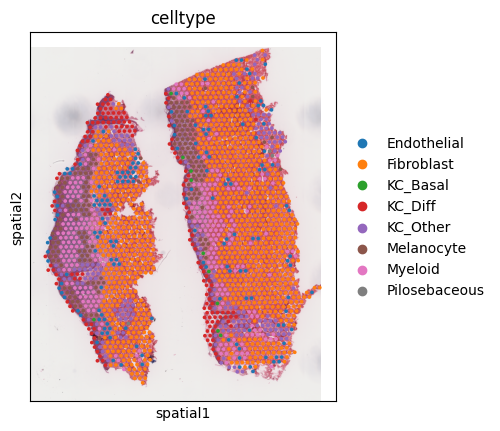

VLP97_A already exists!
Number of filltered spot: 27


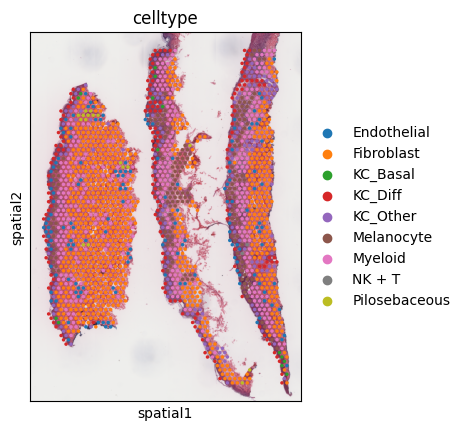

VLP97_D already exists!
Number of filltered spot: 120


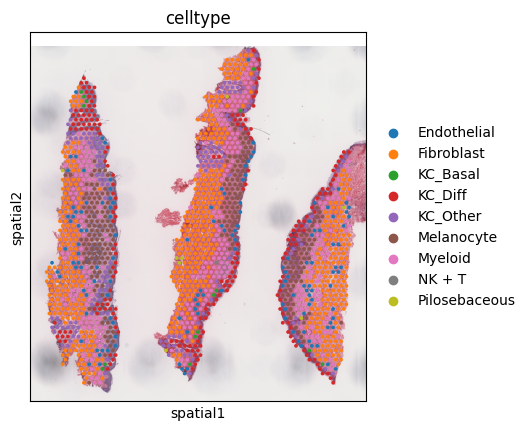

VLP98_A already exists!
Number of filltered spot: 115


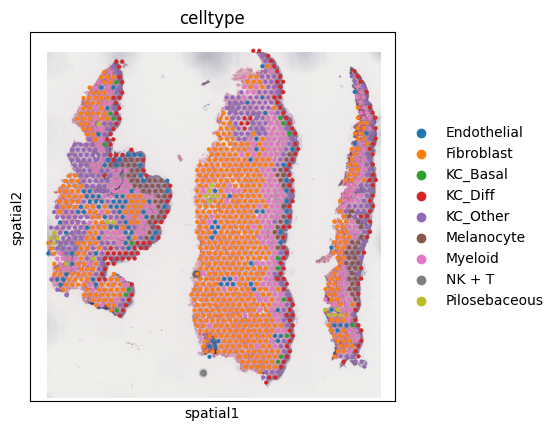

VLP98_D already exists!
Number of filltered spot: 16


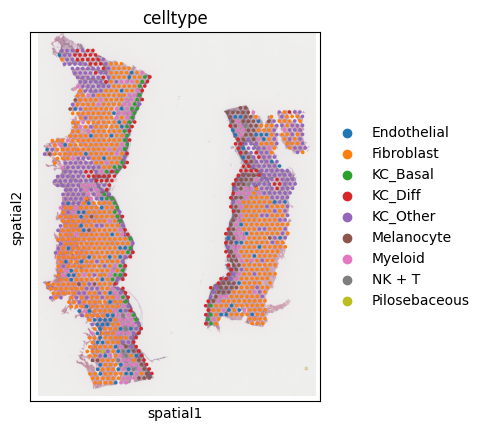

VLP108_A already exists!
Number of filltered spot: 28


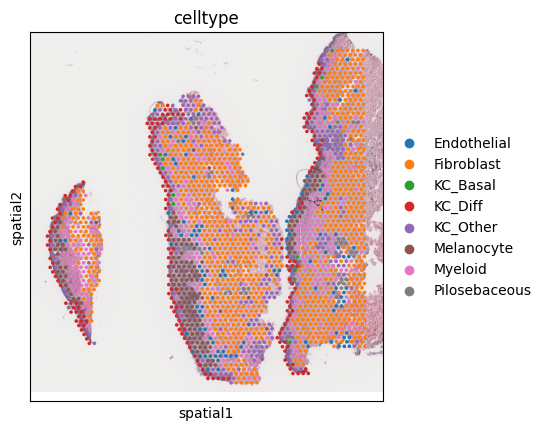

VLP108_D already exists!
Number of filltered spot: 0


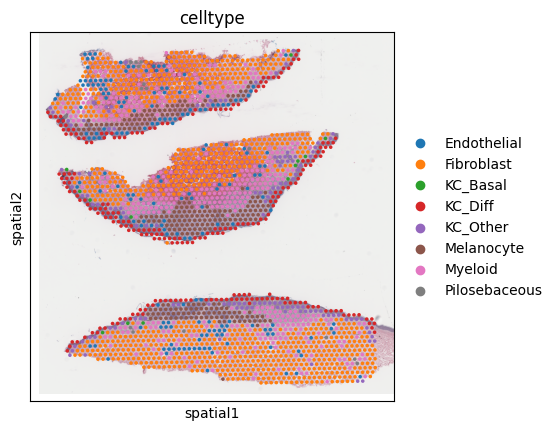

VLP111_A already exists!
Number of filltered spot: 1


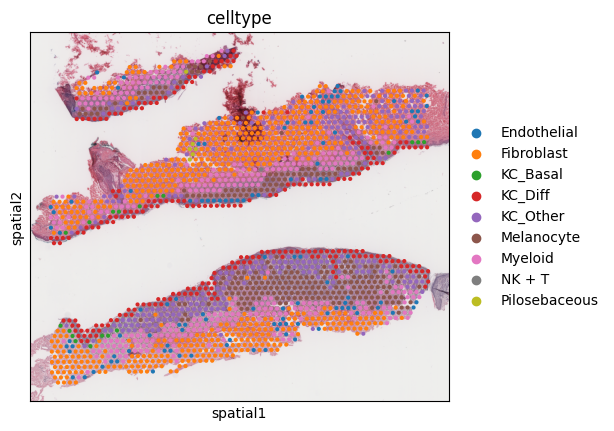

VLP111_D already exists!


In [84]:
# Subset the spots with annotations
lbls = []
adata_lbl = sc.read_h5ad('/home/uqyjia11/Downloads/Q1851/Xiao/Working_project/Skin_Blake/indisct_merge_prep_lt.h5ad')

for name in list(adata_lbl.obs.slide.unique()):
    adata = sc.read_visium(f"/home/uqyjia11/Downloads/Q2051/DeepHis2Exp/Dataset/Blake_skin/{name}/outs/")
    tmp = adata_lbl[adata_lbl.obs.slide == name]
    print("Number of filltered spot:", len(adata)-len(tmp))
    split_names = [name.split('_')[1] for name in list(tmp.obs_names.values)]
    tmp.obs_names = split_names
    adata = adata[tmp.obs.index.values]
    adata.var_names_make_unique()
    adata.obs = pd.concat([adata.obs, tmp.obs], axis=1)
    adata.obsm["spatial"] = adata.obsm["spatial"].astype(int)
    sc.pl.spatial(adata, color='celltype')
    lbls += adata.obs.celltype.unique().astype(str).tolist()
    # adata.write_h5ad(tmp_path+f"/{name}.h5ad") # Change it to your saved data path
    if Path(tmp_path+f"/{name}.h5ad").is_file() is not True:
        print(f"Saving {name} to {tmp_path}")
        adata.write_h5ad(tmp_path+f"/{name}.h5ad") # Change it to your saved data path
    else:
        print(f"{name} already exists!")
lbls = list(set(lbls))


In [35]:
# Crop the patches according to the coordinates
for name in names:
    print(name)
    adata, img = load_img_adata(tmp_path, name)
    tiles = crop_img(adata, name, img, tmp_path)
    adata.obsm['tiles'] = tiles
    adata.write_h5ad(tmp_path+f"/{name}_tiles.h5ad") # Change it to your saved data path


VLP111_D


100%|██████████| 1971/1971 [07:32<00:00,  4.36it/s]


VLP97_A


100%|██████████| 2077/2077 [07:51<00:00,  4.40it/s]


VLP108_A


100%|██████████| 1461/1461 [05:30<00:00,  4.42it/s]


VLP98_D


100%|██████████| 1639/1639 [06:10<00:00,  4.43it/s]


VLP97_D


100%|██████████| 1859/1859 [07:06<00:00,  4.36it/s]


VLP108_D


100%|██████████| 2223/2223 [09:14<00:00,  4.01it/s]


VLP98_A


100%|██████████| 1691/1691 [06:35<00:00,  4.28it/s]


VLP111_A


100%|██████████| 2317/2317 [09:37<00:00,  4.01it/s]


Note: Before we warp up the dataset, plase check the cropped patches first. Sometimes the coordinates in the adata is inconsistent with H&E image. If you find most of tiles were background, or you find the coordinates were out of image scope, you would better address this crucial issue first.

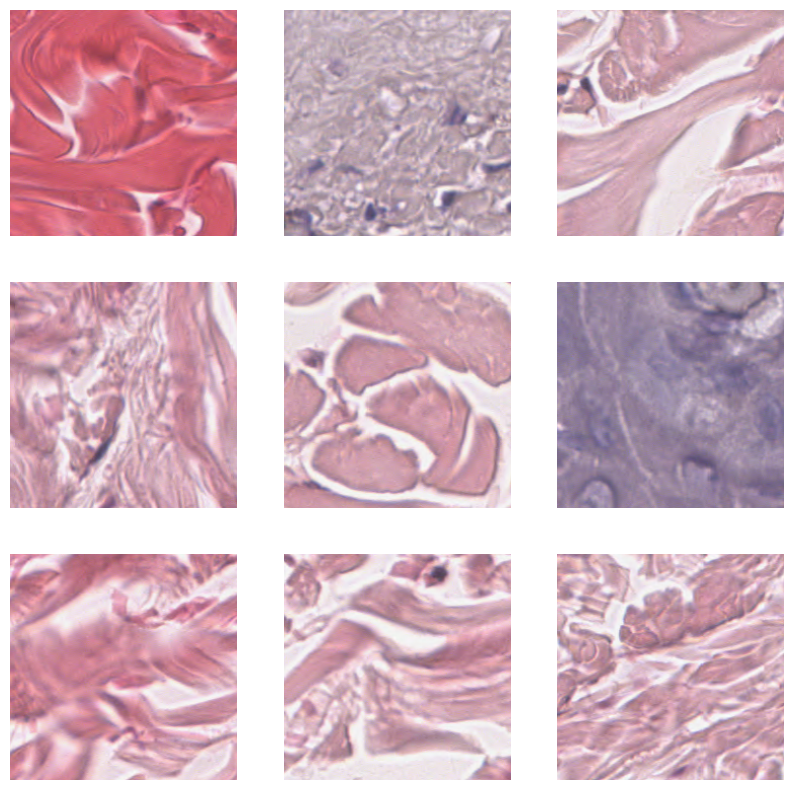

17782

In [36]:
# Check the cropped patches
# Randomly select 9 indices
random_indices = np.random.choice(range(len(adata)), 9, replace=False)

# Plot the images
fig, axes = plt.subplots(3, 3, figsize=(10, 10))

for i, ax in enumerate(axes.flat):
    ax.imshow(adata.obsm["tiles"].astype(np.uint8)[random_indices[i]])
    ax.axis('off')

plt.show()
gc.collect()



## Warp dataset

In [9]:
# dataset for pytorch lightning version 
class Blake_visium(torch.utils.data.Dataset):
    """
    patch, center, exp, adj, oris, sfs = batch
    patch: (num of spots, 3, 224, 224)
    center: (num of spots, 2)
    exp: (num of spots, num of genes)
    adj: (num of spots, num of spots)
    oris: (num of spots, num of genes)
    sfs: (num of spots)
    """
    def __init__(self, names, flatten=False, ori=True, adj=True,
                 neighs=8, color_norm="raw", num_subsets=10, 
                 target=target, exp_norm="lognorm", shuffle=True,
                 gene_list=None):
        super(Blake_visium, self).__init__()

        self.data_dir = f'{abs_path}/DeepHis2Exp/Dataset/Blake_skin_visium'
        self.gene_list = gene_list
        self.ori = ori
        self.adj = adj
        print(f"Datasize:{len(names)}")
        names.sort()
        
        print('Loading metadata...')
        self.adata_dict = {name: sc.read_h5ad(f"{self.data_dir}/{name}_tiles.h5ad") for name in tqdm.tqdm(names)}
        # Subset the adatas into small set
        self.meta_dict = subset_adatas(self.adata_dict, num_subsets=num_subsets, shuffle=shuffle)
        self.names = self.meta_dict.keys()
        self.gene_set = list(gene_list)

        print('Loading gene expression')
        self.exp_norm = exp_norm
        if self.exp_norm=="raw":
            self.exp_dict = {
                i:m.to_df()[self.gene_set].values.astype(np.float64) 
                for i,m in self.meta_dict.items()
            }
        elif self.exp_norm=="lognorm":
            self.exp_dict = {
                i:scp.transform.log(scp.normalize.library_size_normalize(m.to_df()[self.gene_set].values)).astype(np.float64)
                for i,m in self.meta_dict.items()
            }
        elif self.exp_norm=="norm":
            self.exp_dict = {
                i:scp.normalize.library_size_normalize(m.to_df()[self.gene_set].values).astype(np.float64)
                for i,m in self.meta_dict.items()
            }
        elif self.exp_norm=="log1p":
            self.exp_dict = {
                i:scp.transform.log(m.to_df()[self.gene_set].values).astype(np.float64)
                # i:scp.transform.log(m.to_df().values).astype(np.float64)
                for i,m in self.meta_dict.items()
            }
        elif self.exp_norm=="minmax":
            self.exp_dict = {
                i:MinMaxScaler().fit_transform(m.to_df()[self.gene_set].values).astype(np.float64)
                for i,m in self.meta_dict.items()
            }

        if self.ori:
            self.ori_dict = {i:m.to_df()[self.gene_set].values for i,m in self.meta_dict.items()}
            self.counts_dict={}
            for i,m in self.ori_dict.items():
                n_counts=m.sum(1)
                sf = n_counts / np.median(n_counts)
                self.counts_dict[i]=sf
        self.center_dict = {
            i:np.floor(m.obsm["spatial"]).astype(int) 
            for i,m in self.meta_dict.items()
        }
        self.loc_dict = {i:m.obs[['array_row','array_col']].values.astype(np.int8) for i,m in self.meta_dict.items()}
        self.adj_dict = {
            i: torch.tensor(kneighbors_graph(m, n_neighbors=neighs, metric="euclidean", mode='connectivity', include_self=True).toarray(), dtype=torch.float32)
            for i,m in self.center_dict.items()
        }
        print('Loading imgs...')
        self.patch_dict={i: torch.tensor(m.obsm["tiles"], dtype=torch.float32).permute(0,3,1,2) for i,m in self.meta_dict.items()}
        self.id2name = dict(enumerate(self.names))
        self.flatten=flatten
        self.color_norm = color_norm
        self.target = target
        
    def __getitem__(self, index):
        ID=self.id2name[index]
        exps = torch.tensor(self.exp_dict[ID], dtype=torch.float32)
        if self.ori:
            oris = self.ori_dict[ID]
            sfs = self.counts_dict[ID]
        centers = self.center_dict[ID]
        loc = self.loc_dict[ID]
        adj = self.adj_dict[ID]
        patches = self.patch_dict[ID]
        positions = torch.LongTensor(loc)
        data=[patches, positions, exps]
        if self.adj:
            data.append(adj)
        if self.ori:
            data+=[torch.tensor(oris, dtype=torch.float32),torch.tensor(sfs, dtype=torch.float32)]
        return data
        
    def __len__(self):
        return len(self.meta_dict)
    
    def get_img(self, name):
        path = f"{self.data_dir}/{name}.tif"
        im = Image.open(path).convert('RGB')
        return im

## Predict gene expression

### Pytorch version

In [19]:
# Hyperparameters
exp_kind = "hvg"
emb_kind = "Phikon_emb"
num_epochs = 100
T_0 = 5
T_mult = 2
lr = 1e-4
batch_size = 32
weight_balance = False
model_id = f"{emb_kind}_imgexp"
target_genes = np.load("../Dataset/Gene_list/Blake_skin_hvg_func.npy")
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

if emb_kind == "Phikon_emb":
    img_dim = 768
elif emb_kind == "UNI_emb":
    img_dim = 1024
elif emb_kind == "CONCH_emb":
    img_dim = 512
elif emb_kind == "X_scGPT":
    img_dim = 512
    

In [20]:
tr_names = ['VLP97_A', 'VLP108_A', 'VLP111_D',  'VLP97_D', 'VLP108_D']
val_names = ['VLP98_D']
te_names = ['VLP98_A', 'VLP111_A']

te_dataset = WarpDataset(te_names, exp_kind, target_genes=target_genes)
val_dataset = WarpDataset(val_names, exp_kind, target_genes=target_genes)
tr_dataset = WarpDataset(tr_names, exp_kind, target_genes=target_genes)

tr_loader = DataLoader(tr_dataset, batch_size=batch_size, shuffle=False)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)
te_loader = DataLoader(te_dataset, batch_size=batch_size, shuffle=False)

100%|██████████| 1/1 [00:03<00:00,  3.23s/it]


In [24]:
# Initialize the model
if model == "deeppt":
    model = DeepPT(n_genes=te_dataset.exp.shape[1], hidden_dim=512, learning_rate=1e-4)
elif model == "bleep":
    model = BLEEP(n_genes=te_dataset.exp.shape[1])
    
model.to(device)

optimizer = optim.AdamW(model.parameters(), lr)


In [14]:
# Train the model
best_validation_loss = float('inf')
tr_loss_epoch = []
tr_accuracy_epoch = []
val_loss_epoch = []
val_accuracy_epoch = []

for epoch in range(num_epochs):
    # Training loop
    model.train()  # Set the model to training mode
    tr_loss = []
    iters = len(tr_loader)
    correct = 0
    for i, data in enumerate(tr_loader, 0):
        imgs, _, exp, _ = data
        imgs, exp = imgs.to(device), exp.to(device)
        optimizer.zero_grad()  # Zero the parameter gradients
        pred_exp, AE_in, AE_out = model(imgs)  # Forward pass
        loss = F.mse_loss(pred_exp, exp) + F.mse_loss(AE_in, AE_out) # Compute the loss
        loss.backward()  # Backward pass
        optimizer.step()  # Optimize
        tr_loss.append(loss.cpu().detach().numpy())
        
    # Validation loop
    model.eval()
    val_loss = []
    for i, data in enumerate(val_loader, 0):
        imgs, _, exp, _ = data
        imgs, exp = imgs.to(device), exp.to(device)
        optimizer.zero_grad()  # Zero the parameter gradients
        pred_exp, *_ = model(imgs)  # Forward pass
        loss = F.mse_loss(pred_exp, exp) # Compute the loss
        val_loss.append(loss.cpu().detach().numpy())

    # Report loss and accuracy
    print(f"Epoch {epoch+1}, tr_loss: {np.stack(tr_loss).mean()}, val_loss: {np.stack(val_loss).mean()}")
    tr_loss_epoch.append(np.stack(tr_loss).mean())
    val_loss_epoch.append(np.stack(val_loss).mean())
    
    # Save model if validation loss has decreased
    if loss < best_validation_loss:
        best_validation_loss = loss
        # torch.save(model.state_dict(), f'../../Yuanhao/Spacell2/Model_weights/{model_id}.pth')
        print("Best model saved.")

print('Finished Training')


Epoch 1, tr_loss: 0.11350073665380478, val_loss: 0.10965034365653992
Best model saved.
Epoch 2, tr_loss: 0.11114312708377838, val_loss: 0.1092652902007103
Epoch 3, tr_loss: 0.10864198207855225, val_loss: 0.10963213443756104
Epoch 4, tr_loss: 0.10755383968353271, val_loss: 0.10997889935970306
Epoch 5, tr_loss: 0.10589689016342163, val_loss: 0.10840070247650146
Epoch 6, tr_loss: 0.1043117567896843, val_loss: 0.1081591323018074
Epoch 7, tr_loss: 0.10223697125911713, val_loss: 0.10707831382751465
Epoch 8, tr_loss: 0.10047723352909088, val_loss: 0.10814661532640457
Epoch 9, tr_loss: 0.09874819964170456, val_loss: 0.10692322999238968
Epoch 10, tr_loss: 0.09689760208129883, val_loss: 0.10724161565303802
Epoch 11, tr_loss: 0.09474721550941467, val_loss: 0.10859111696481705
Epoch 12, tr_loss: 0.09353721886873245, val_loss: 0.11630256474018097
Best model saved.
Epoch 13, tr_loss: 0.09286616742610931, val_loss: 0.10812793672084808
Epoch 14, tr_loss: 0.09147895872592926, val_loss: 0.10846325010061

KeyboardInterrupt: 

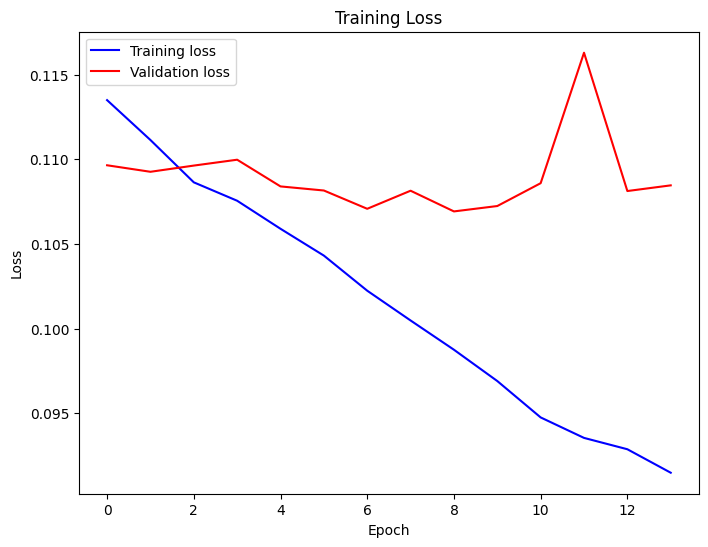

In [112]:
f = plt.figure(figsize=(8, 6))

# Plotting training loss
plt.plot(tr_loss_epoch, color='blue', label='Training loss')
plt.plot(val_loss_epoch, color='red', label='Validation loss')

# Adding titles, labels, and legend
plt.title('Training Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
# plt.savefig(f"../../Images/{model_id}_loss.png")
plt.show()


In [43]:
def inference(data_loader):
    model.eval()  # Set the model to training mode
    pred_lbls = []
    exps = []
    for i, data in enumerate(data_loader, 0):
        imgs, _, exp, _ = data
        imgs, exp = imgs.to(device), exp.to(device)
        pred_exp, AE_in, AE_out = model(imgs)  # Forward pass
        pred_lbls.append(pred_exp.detach().cpu())
        exps.append(exp.detach().cpu())
    pred_lbls = torch.cat(pred_lbls, dim=0).numpy()
    exps = torch.cat(exps, dim=0).numpy()
    pcc = np.array([pearsonr(pred_lbls[:,i], exps[:,i])[0] for i in range(exps.shape[1])])
    mean_pcc = pcc.mean() # Compute the accuracy
    print(f"Mean PCC for this dataset is : {mean_pcc}")
    return pred_lbls, exps, pcc


In [44]:
print("Evaluate train dataset...")
tr_pred_lbls, tr_exps, tr_pccs = inference(tr_loader)
torch.cuda.empty_cache()

print("Evaluate validation dataset...")
val_pred_lbls, val_exps, val_pccs = inference(val_loader)

print("Evaluate test dataset...")
te_pred_lbls, te_exps, te_pccs = inference(te_loader)


Evaluate train dataset...
Mean PCC for this dataset is : 0.1236736059867854
Evaluate validation dataset...
Mean PCC for this dataset is : nan
Evaluate test dataset...
Mean PCC for this dataset is : 0.11097351216713472


In [104]:
tmp_path = f"../Dataset/Blake_skin_visium"

name = te_names[0]
te_dataset = WarpDataset([name], exp_kind="hvg", target_genes=target_genes)
te_loader = DataLoader(te_dataset, batch_size=batch_size, shuffle=False)
print(f"Evaluate test dataset: {name} ...")
te_pred_lbls, _, te_pccs = inference(te_loader)
pred_adata = te_dataset.adata[:, target_genes].copy()
pred_adata.X = te_pred_lbls
pred_adata.var["pearsonr"]= te_pccs
#     pred_adata.write_h5ad(tmp_path+f"/pred_{name}.h5ad")
predictable_genes = pred_adata[:, pred_adata.var["pearsonr"]>0.3].var_names.values
print(predictable_genes)


100%|██████████| 1/1 [00:00<00:00,  1.14it/s]


Evaluate test dataset: VLP98_A ...
Mean PCC for this dataset is : nan
['PYGL' 'CSTA' 'CALML5' 'CCND3' 'CALML3' 'SPINK5' 'CCL27']


Text(0, 0.5, 'PCC')

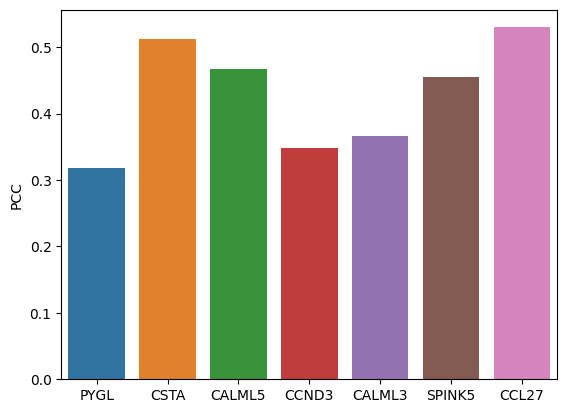

In [105]:
df = pd.DataFrame(pred_adata[:, pred_adata.var["pearsonr"]>0.3].var["pearsonr"]).T
sns.barplot(df)
plt.ylabel("PCC")

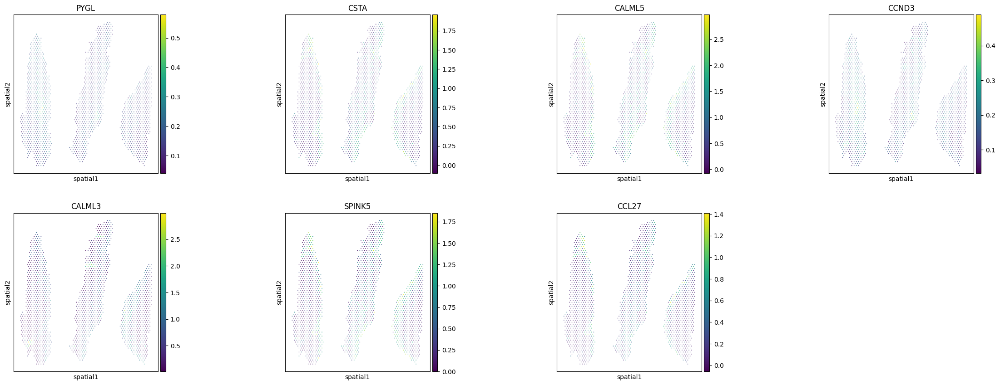

<Figure size 640x480 with 0 Axes>

In [106]:
gc.collect()
sc.pl.spatial(pred_adata, color=predictable_genes, spot_size=130)
plt.savefig(f"predictable_gene_vis_{name}.png", dpi=300)

In [107]:
tmp_path = f"../Dataset/Blake_skin_visium"

name = te_names[1]
te_dataset = WarpDataset([name], exp_kind="hvg", target_genes=target_genes)
te_loader = DataLoader(te_dataset, batch_size=batch_size, shuffle=False)
print(f"Evaluate test dataset: {name} ...")
te_pred_lbls, _, te_pccs = inference(te_loader)
pred_adata = te_dataset.adata[:, target_genes].copy()
pred_adata.X = te_pred_lbls
pred_adata.var["pearsonr"]= te_pccs
#     pred_adata.write_h5ad(tmp_path+f"/pred_{name}.h5ad")
predictable_genes = pred_adata[:, pred_adata.var["pearsonr"]>0.3].var_names.values
print(predictable_genes)


100%|██████████| 1/1 [00:01<00:00,  1.08s/it]


Evaluate test dataset: VLP111_A ...
Mean PCC for this dataset is : 0.11776086332557753
['CSTA' 'S100A8' 'CALML5' 'CCND3' 'CALML3' 'CCL19' 'S100A9' 'SPINK5'
 'CCL27']


In [47]:
tmp_path = f"../Dataset/Blake_skin_visium"
sample = "VLP98_A"
pred_adata = sc.read_h5ad(tmp_path+f"/pred_{sample}.h5ad")
raw_adata = sc.read_h5ad(tmp_path+f"/{sample}.h5ad")
raw_adata = raw_adata[pred_adata.obs_names, :]

# Load the image
image = Image.open(tmp_path+f"/{sample}.tif")

# Load spatial coordinates and expression data
spatial_coords = raw_adata.obsm["spatial"]  # Replace with your spatial coordinates
target_genes = pred_adata.var.sort_values(by="pearsonr")[-5:].index.values

In [48]:
pred_adata.to_df()

,TMEFF2,GHR,MASP1,IGHG3,LILRB4,BRSK2,FAM30A,MFGE8,TCF7L2,FGFR1,...,TPTE,ACVR1C,ETV7,IL1RL1,CCL27,MCAM,CCL23,FLNA,IFITM2,FOS
AACAGGAAGAGCATAG-1,0.010962,0.027933,0.048837,-0.015014,0.002273,0.004973,0.005022,0.224375,0.124789,0.260440,...,0.001007,0.004952,0.013222,-0.003330,0.053917,0.265788,0.017950,0.278405,0.130802,0.092633
AACATACTCATATGCG-1,-0.005850,0.022534,0.058608,0.020970,0.019748,0.000513,0.000622,0.186386,0.144886,0.234071,...,-0.003960,-0.002068,0.020315,0.006779,0.017504,0.198229,0.017553,0.227048,0.127606,0.081385
AACATAGTCTATCTAC-1,0.007412,0.013539,0.008388,-0.027949,0.003757,0.000078,0.003252,0.122795,0.088218,0.147495,...,-0.002571,-0.004008,0.004540,0.010748,0.116880,0.163230,0.007147,0.150244,0.089540,0.083183
AACCAATCTGGTTGGC-1,0.000599,0.023011,0.066373,-0.080021,-0.005866,0.000575,0.005593,0.186828,0.091158,0.206780,...,0.005140,0.012123,-0.014991,-0.010942,0.137551,0.252111,0.011178,0.295164,0.084371,0.155566
AACCACTAACATGATT-1,0.006091,-0.004584,0.026751,-0.021876,-0.002219,0.005998,-0.000920,0.183208,0.132927,0.191077,...,0.002971,0.009608,0.005215,0.011392,0.204000,0.128552,0.004016,0.181416,0.088334,0.253375
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TGTCATGCATGAGCAC-1,0.000465,0.022140,0.047637,-0.000008,0.025883,0.005979,0.000425,0.181133,0.140482,0.193940,...,-0.001174,0.001577,0.003960,0.025810,0.032152,0.197931,-0.008452,0.246824,0.124818,0.058075
TGTCCATGTATGGAAT-1,0.023085,0.061503,0.083217,0.051197,0.015755,0.015814,-0.008119,0.390147,0.236900,0.480773,...,0.001664,0.007111,-0.002071,0.044457,0.061132,0.453205,0.020985,0.524249,0.217648,0.325675
TGTTAAGGAAGTCTTA-1,0.004435,0.038461,0.072480,0.055539,0.050919,0.007207,0.008351,0.446836,0.236483,0.508951,...,0.004341,0.006410,-0.000818,0.041760,0.024726,0.521592,0.029208,0.577022,0.299724,0.366571
TGTTCATTGGTCCAAG-1,0.019686,0.042705,0.053211,-0.017464,0.025323,-0.002179,-0.011628,0.233232,0.118053,0.240830,...,-0.002774,-0.005904,0.014634,0.013336,0.108860,0.277855,0.017576,0.263511,0.128402,0.168269


In [49]:
raw_adata.to_df()

,SAMD11,NOC2L,KLHL17,PLEKHN1,PERM1,HES4,ISG15,AGRN,RNF223,C1orf159,...,MT-ND2,MT-CO2,MT-ATP6,MT-CO3,MT-ND3,MT-ND4L,MT-ND4,MT-ND5,MT-ND6,MT-CYB
AACAGGAAGAGCATAG-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,9.0,3.0,3.0,8.0,1.0,3.0,5.0,0.0,0.0,4.0
AACATACTCATATGCG-1,0.0,0.0,0.0,0.0,0.0,3.0,0.0,2.0,0.0,0.0,...,13.0,13.0,8.0,23.0,1.0,7.0,12.0,2.0,2.0,11.0
AACATAGTCTATCTAC-1,0.0,5.0,0.0,7.0,0.0,2.0,0.0,4.0,0.0,0.0,...,32.0,76.0,35.0,114.0,9.0,18.0,57.0,2.0,9.0,27.0
AACCAATCTGGTTGGC-1,0.0,1.0,0.0,0.0,0.0,0.0,1.0,6.0,0.0,0.0,...,42.0,68.0,29.0,101.0,16.0,22.0,63.0,5.0,18.0,52.0
AACCACTAACATGATT-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,...,5.0,11.0,7.0,10.0,1.0,8.0,18.0,0.0,2.0,13.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TGTCATGCATGAGCAC-1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,1.0,0.0,3.0,2.0,0.0,0.0,0.0
TGTCCATGTATGGAAT-1,0.0,0.0,0.0,0.0,0.0,2.0,0.0,2.0,0.0,0.0,...,31.0,11.0,5.0,38.0,4.0,32.0,15.0,5.0,7.0,10.0
TGTTAAGGAAGTCTTA-1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,3.0,0.0,1.0,...,18.0,63.0,25.0,102.0,8.0,30.0,42.0,2.0,19.0,20.0
TGTTCATTGGTCCAAG-1,0.0,0.0,0.0,0.0,1.0,2.0,0.0,3.0,0.0,0.0,...,11.0,8.0,7.0,31.0,1.0,7.0,9.0,0.0,6.0,5.0


In [6]:
for target_gene in target_genes:
    pcc = pred_adata.var.loc[target_gene].values

    expression_values = pred_adata.to_df()[target_gene]  # Replace with your expression values
    gene_plot(target_gene, expression_values, pcc, 
              False, image, spatial_coords,)

    expression_values = raw_adata.to_df()[target_gene]  # Replace with your expression values
    gene_plot(target_gene, expression_values, pcc, 
              True, image, spatial_coords,)
    

NameError: name 'target_genes' is not defined

In [108]:
name

'VLP111_A'

Text(0, 0.5, 'PCC')

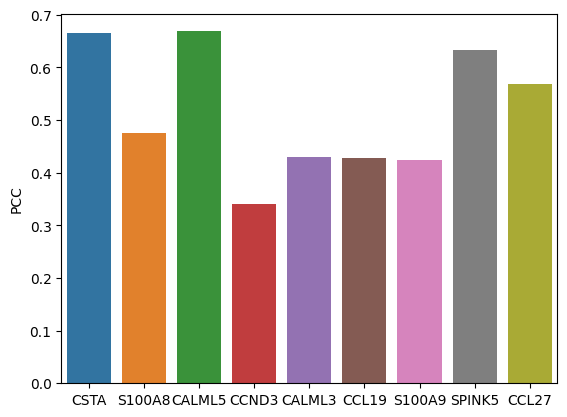

In [109]:
df = pd.DataFrame(pred_adata[:, pred_adata.var["pearsonr"]>0.3].var["pearsonr"]).T
sns.barplot(df)
plt.ylabel("PCC")

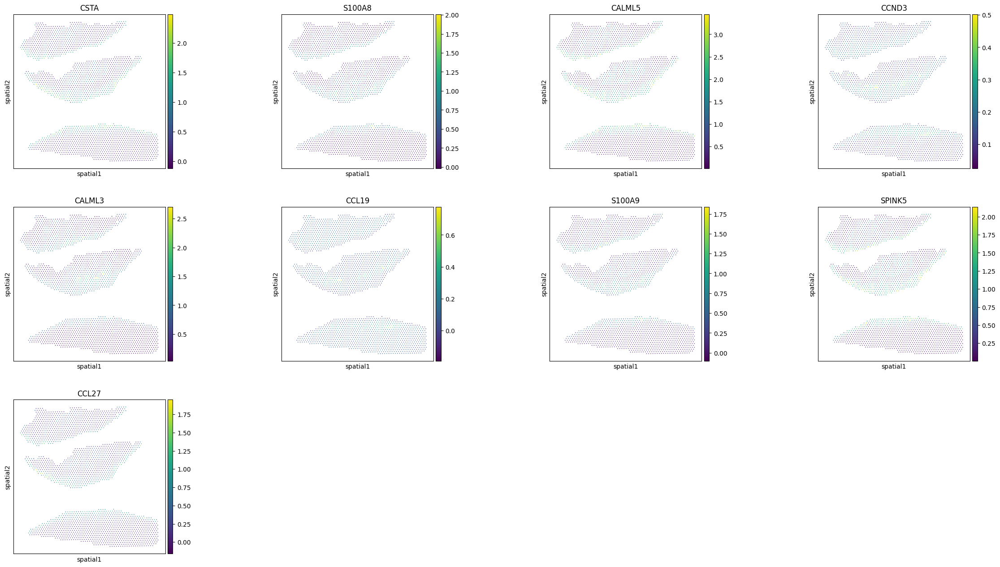

<Figure size 640x480 with 0 Axes>

In [111]:
gc.collect()
sc.pl.spatial(pred_adata, color=predictable_genes, spot_size=130)
plt.savefig(f"predictable_gene_vis_{name}.png", dpi=300)

<Axes: >

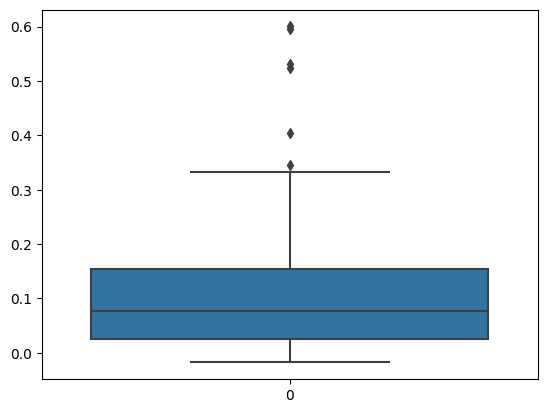

In [49]:
import seaborn as sns

sns.boxplot(te_pccs)

### Pytorch lightning version

In [11]:
import pytorch_lightning as pl

from Models.Hist2ST.hist2st import *
from Models.STnet.stnet import *
from Models.HisToGene.histogene import *
from Models.DeepPT.deeppt import *
from Models.STimage.stimage import *
from Models.BLEEP.bleep import *
from Models.DeepSpaCE.deepspace import *


[easydl] tensorflow not available!


In [19]:
# Hyperparameters
model_name = "bleep"
num_epochs = 350
num_subsets = 10
model_id = f"{model_name}"
target_genes = np.load("../Dataset/Gene_list/Blake_skin_hvg_func.npy")


In [20]:
# Initialize model
if model_name == "hist2st":
    tag = '5-7-2-8-4-16-32'
    kernel,patch,depth1,depth2,depth3,heads,channel=map(lambda x:int(x),tag.split('-'))
    model = Hist2ST(
        depth1=depth1, depth2=depth2,
        n_genes=len(target_genes), learning_rate=1e-5, label=None, 
        kernel_size=kernel, patch_size=patch, n_pos=256,
        heads=heads, channel=channel, dropout=0.2,
        zinb=0.25, nb=False,
        bake=5, lamb=0.5,)
elif model_name == "stnet":
    model = STModel(n_genes=len(target_genes), hidden_dim=1024, learning_rate=1e-6)
elif model_name == "histogene":
    model = HisToGene(patch_size=224, n_layers=4, n_genes=len(target_genes), dim=1024, 
                      learning_rate=1e-5, dropout=0.1, n_pos=256)
elif model_name == "deeppt":
    model = DeepPT(n_genes=len(target_genes), hidden_dim=512, learning_rate=1e-4,)
elif model_name == "stimage":
    model = STimage(n_genes=len(target_genes), ft=False, learning_rate=1e-5)
elif model_name == "bleep":
    model = BLEEP(n_genes=len(target_genes)) 
elif model_name == "deepspace":
    model = DeepSpaCE(n_genes=len(target_genes)) 

# Create folder to save model weights
if not os.path.isdir(f"{model_weight_path}/{dataset_name}/"):
    print("Dir is not exist, create one!")
    os.mkdir(f"{model_weight_path}/{dataset_name}/")

early_stop = pl.callbacks.EarlyStopping(monitor='val_loss', mode='min', patience=10)
checkpoint_callback = pl.callbacks.ModelCheckpoint(save_top_k=1, dirpath=f"{model_weight_path}", 
                                                   filename=f"{model_id}", 
                                                   monitor="val_loss", mode="min")

# Define trainer for each model
if model_name == "hist2st":
    trainer = pl.Trainer(accelerator='auto', 
                         callbacks=[early_stop, checkpoint_callback], 
                         max_epochs=350, logger=True)
elif model_name == "stnet":
    trainer = pl.Trainer(accelerator='auto', 
                         callbacks=[early_stop, checkpoint_callback], 
                         max_epochs=50, logger=True)
elif model_name == "histogene":
    trainer = pl.Trainer(accelerator='auto', 
                         callbacks=[early_stop, checkpoint_callback], 
                         max_epochs=100, logger=True)
elif model_name == "deeppt":
    trainer = pl.Trainer(accelerator='auto', 
                         callbacks=[early_stop, checkpoint_callback], 
                         max_epochs=500, logger=True)
elif model_name == "stimage":
    trainer = pl.Trainer(accelerator='auto', 
                         callbacks=[early_stop, checkpoint_callback], 
                         enable_checkpointing=True,
                         max_epochs=100, logger=True)
elif model_name == "bleep":
    trainer = pl.Trainer(accelerator='auto', 
                         callbacks=[early_stop, checkpoint_callback], 
                         max_epochs=150, logger=True)   
elif model_name == "deepspace":
    trainer = pl.Trainer(accelerator='auto', 
                         callbacks=[early_stop, checkpoint_callback], 
                         max_epochs=100, logger=True)   

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


In [23]:
tr_names = ['VLP97_A', 'VLP108_A', 'VLP111_D',  'VLP97_D', 'VLP108_D']
val_names = ['VLP98_D']

tr_dataset = Blake_visium(tr_names, num_subsets, gene_list=target_genes)
val_dataset = Blake_visium(val_names, num_subsets, gene_list=target_genes)

tr_loader = DataLoader(tr_dataset, batch_size=1, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

Datasize:5
Loading metadata...


100%|██████████| 5/5 [00:26<00:00,  5.36s/it]


subset_size: 146
subset_size: 222
subset_size: 197
subset_size: 207
subset_size: 185
Loading gene expression
Loading imgs...
Datasize:1
Loading metadata...


100%|██████████| 1/1 [00:04<00:00,  4.09s/it]


subset_size: 163
Loading gene expression
Loading imgs...


In [ ]:
# Start training and save best model
trainer.fit(model, tr_loader, val_loader)

print(checkpoint_callback.best_model_path)   # prints path to the best model's checkpoint
print(checkpoint_callback.best_model_score) # and prints it score
best_model = model.load_state_dict(torch.load(checkpoint_callback.best_model_path)["state_dict"])
torch.save(torch.load(checkpoint_callback.best_model_path)["state_dict"], f"{model_weight_path}/{dataset_name}/{model_name}.ckpt")
os.remove(checkpoint_callback.best_model_path)


In [24]:
# Inference and Model Evaluation
te_names = ['VLP98_A', 'VLP111_A']
model.load_state_dict(torch.load(f"{model_weight_path}/{dataset_name}/{model_name}.ckpt")) # Load the pretrained model.
for te_name in te_names:
    print(f"{model_name}_{te_name}")
    te_dataset = Blake_visium([te_name], num_subsets, gene_list=target_genes)
    te_loader = DataLoader(te_dataset, batch_size=1, shuffle=False)
    gt = sc.concat([te_dataset.meta_dict[sub_slide] for sub_slide in list(te_dataset.meta_dict.keys())])[:,target_genes]
    pred_adata = gt.copy()

    if model_name == "bleep":
        gc.collect()
        gt_exp, pred = bleep_inference(model, trainer, tr_loader, te_loader, method="average")
        pred_adata.X = pred
        gt.X = gt_exp
    else:
        gc.collect()
        out = trainer.predict(model, te_loader)
        pred_adata.X = np.concatenate([out[i][0] for i in range(len(out))])
        gt.X = np.concatenate([out[i][1] for i in range(len(out))])

    pcc = np.array([pearsonr(pred_adata.X[:,i], gt.X.toarray()[:,i])[0] for i in range(gt.X.toarray().shape[1])])
    pred_adata.var["pearsonr"]= pcc
    pred_adata.write_h5ad(f"{abs_path}/DeepHis2Exp/Results/Blake_skin_project/pred_{model_name}_{te_name}.h5ad")
    gt.write_h5ad(f"{abs_path}/DeepHis2Exp/Results/Blake_skin_project/gt_{model_name}_{te_name}.h5ad")


bleep_VLP98_A
Datasize:1
Loading metadata...


100%|██████████| 1/1 [00:04<00:00,  4.71s/it]


subset_size: 169
Loading gene expression
Loading imgs...


  0%|          | 0/5 [02:31<?, ?it/s]
You are using a CUDA device ('NVIDIA A40') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

finding matches, using average of top 50 expressions
matched spot embeddings pred shape:  (1690, 256)
matched spot expression pred shape:  (1690, 118)
bleep_VLP111_A
Datasize:1
Loading metadata...


100%|██████████| 1/1 [00:05<00:00,  5.73s/it]


subset_size: 231
Loading gene expression
Loading imgs...


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

finding matches, using average of top 50 expressions
matched spot embeddings pred shape:  (2310, 256)
matched spot expression pred shape:  (2310, 118)


### Visualize predictable genes

bleep_VLP98_A
There are 29 predictable genes:
['CCND3' 'POLD4' 'NR4A1' 'TCF7L1' 'SFRP1' 'COMP' 'S100A9' 'PYGL' 'S100A8'
 'CCL27' 'LCN2' 'CEBPD' 'SETBP1' 'CALML3' 'GLG1' 'FOS' 'TCF7L2' 'TCF12'
 'CHI3L1' 'ETV7' 'FLNA' 'CCND2' 'PML' 'CSTA' 'PSIP1' 'FGFR2' 'CALML5'
 'KIT' 'IL16']


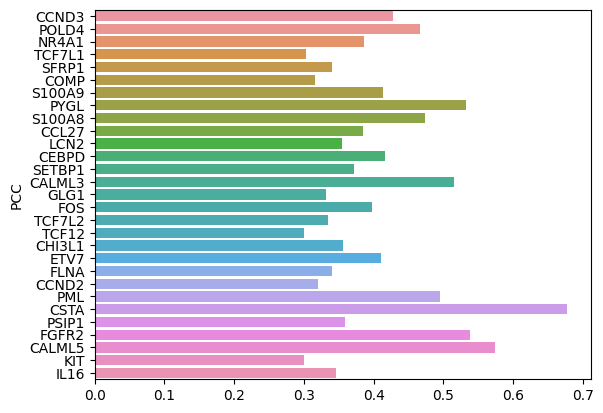

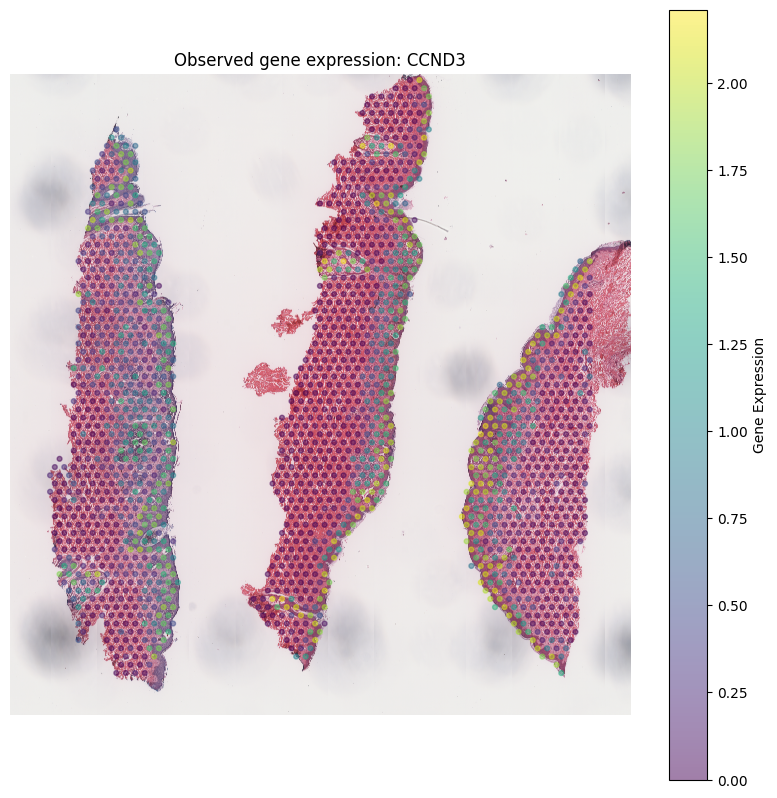

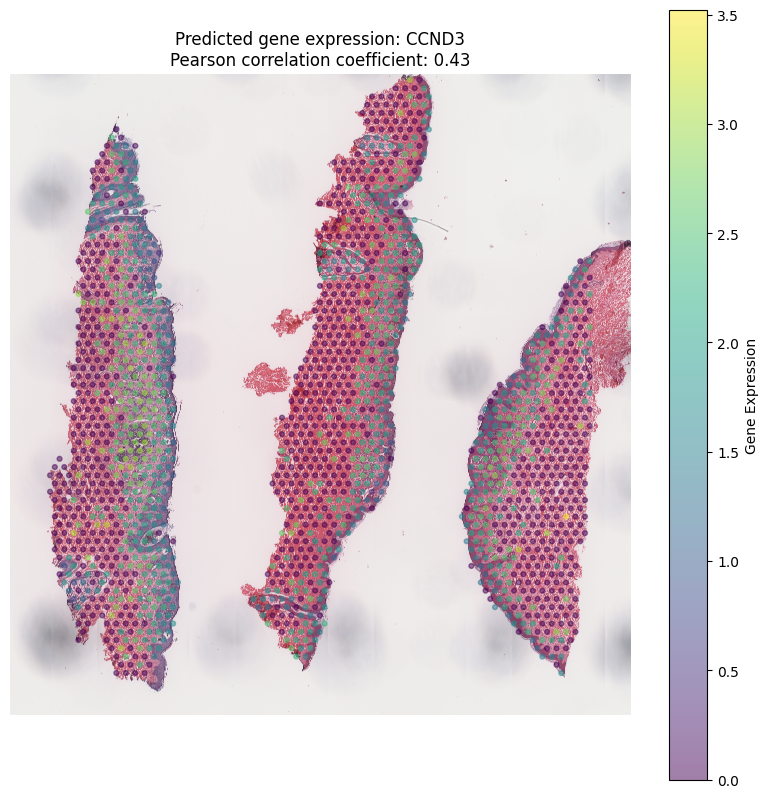

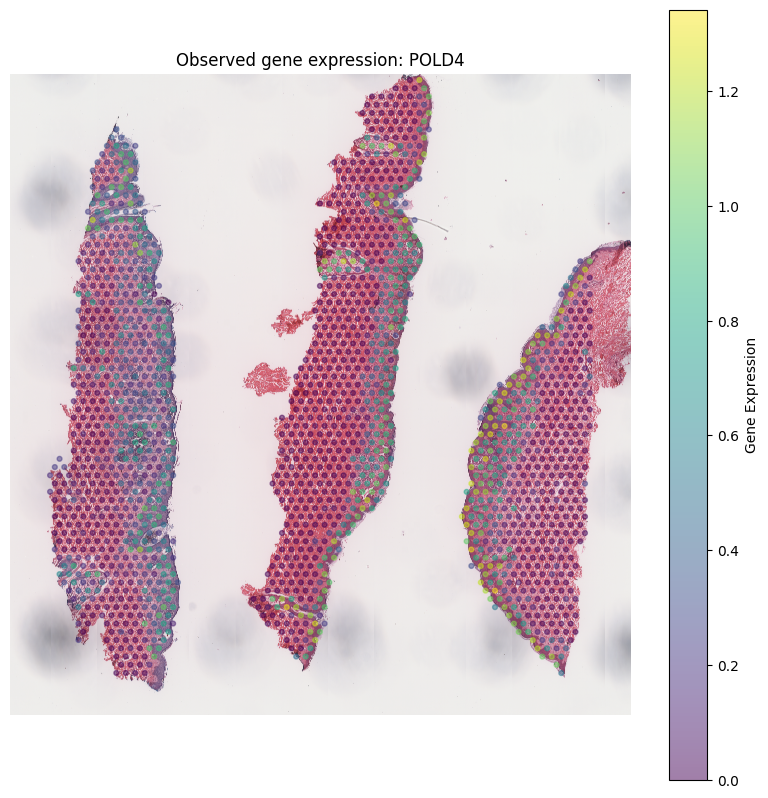

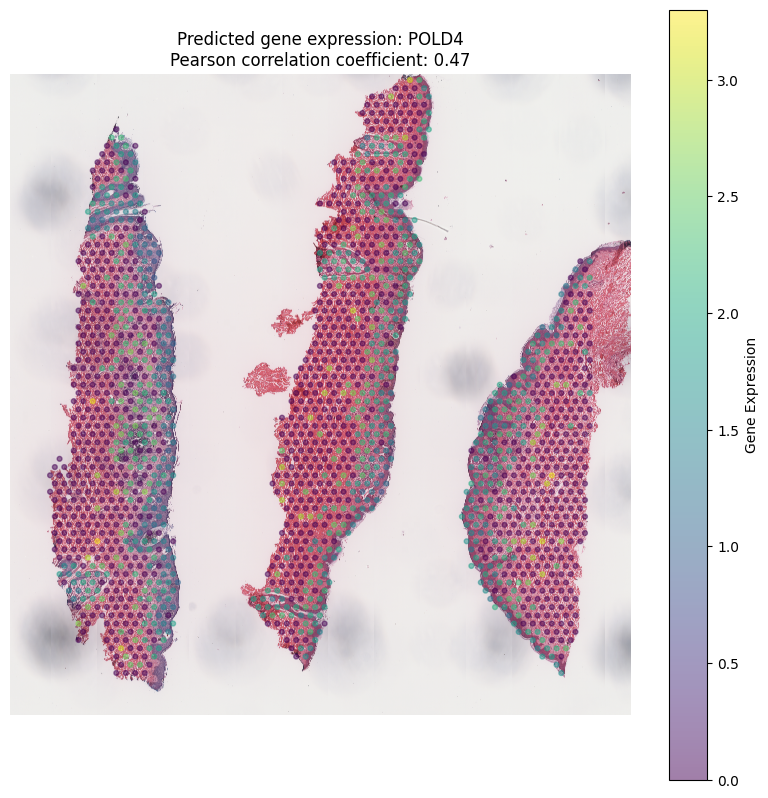

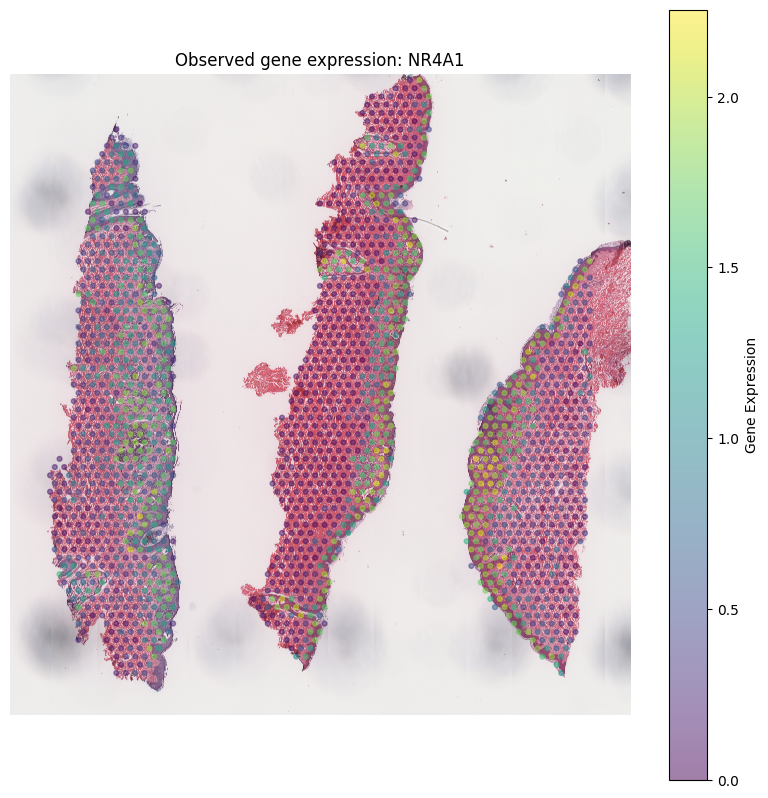

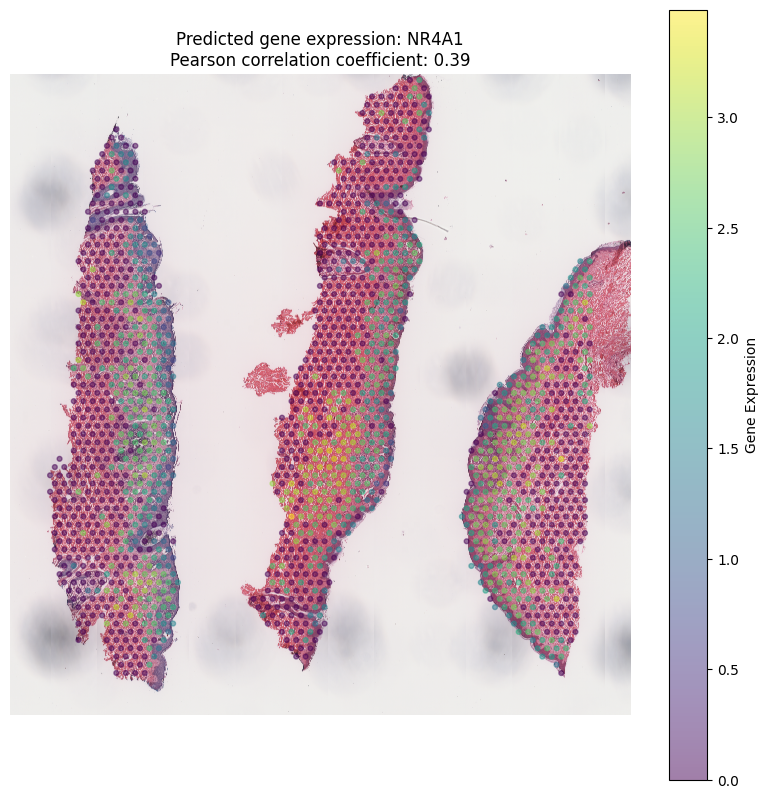

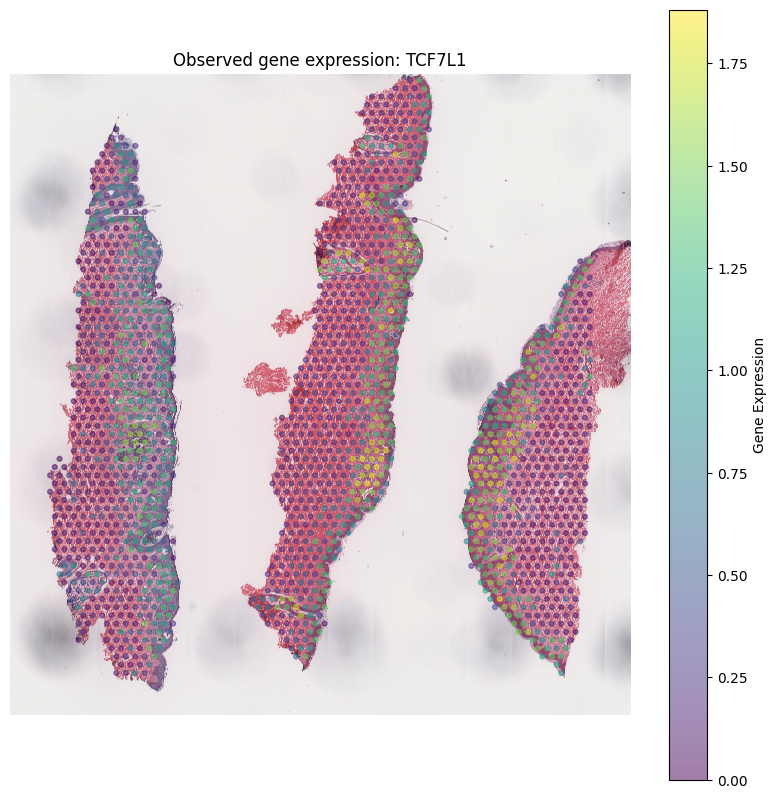

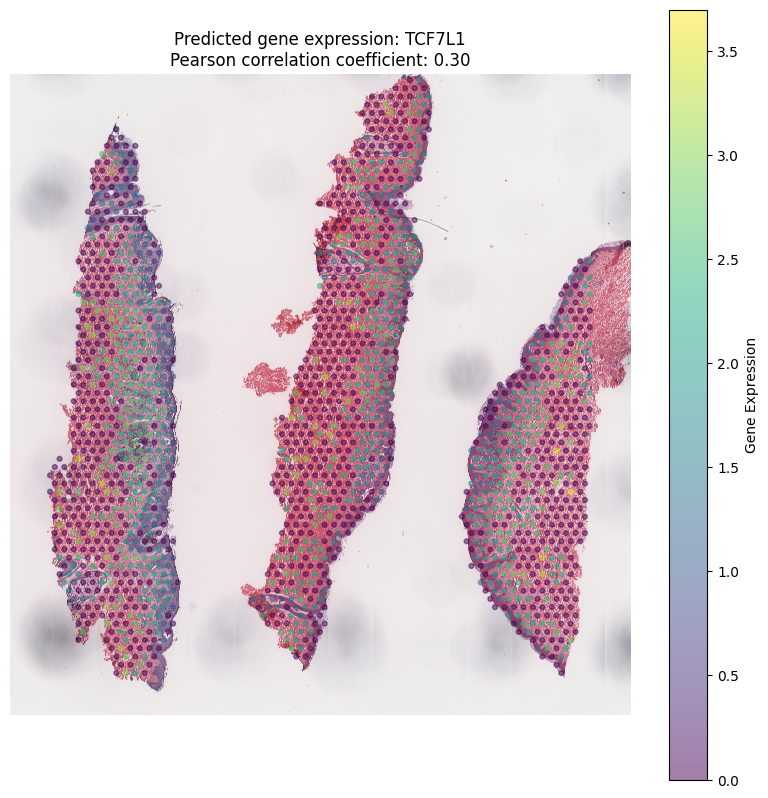

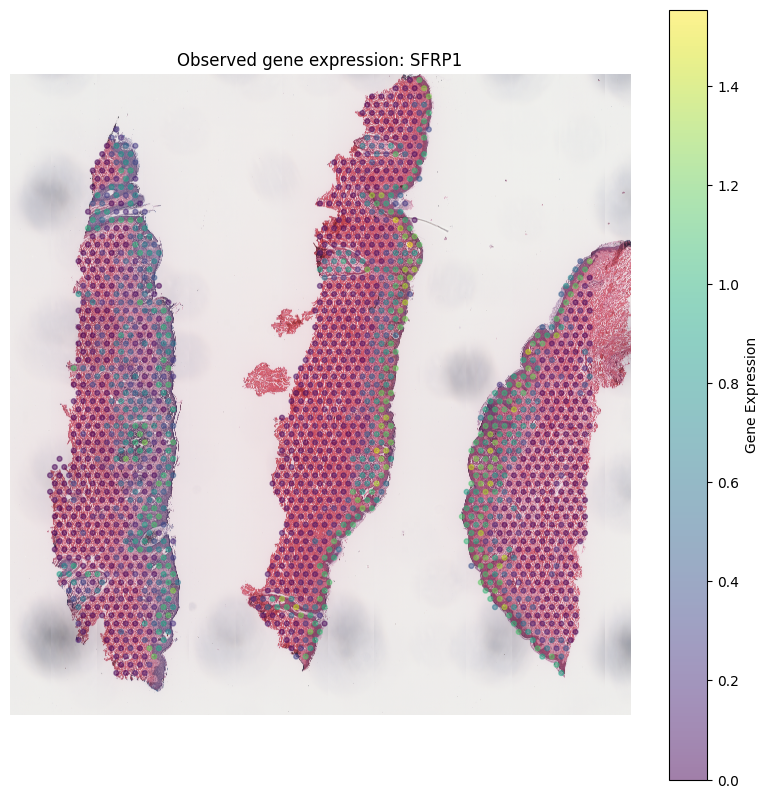

In [27]:
te_names = ['VLP98_A', 'VLP111_A'] # State test samples here.
for te_name in te_names:
    # Load the image
    image = Image.open(tmp_path+f"/{te_name}.tif")
    # Load the predicted and observed data
    print(f"{model_name}_{te_name}")
    pred_adata = sc.read_h5ad(f"{abs_path}/DeepHis2Exp/Results/Blake_skin_project/pred_{model_name}_{te_name}.h5ad")
    exps = sc.read_h5ad(f"{abs_path}/DeepHis2Exp/Results/Blake_skin_project/gt_{model_name}_{te_name}.h5ad")
    # Find the predictable genes
    predictable_genes = pred_adata[:, pred_adata.var["pearsonr"]>0.3].var_names.values
    print(f"There are {len(predictable_genes)} predictable genes:\n{predictable_genes}")
    # Plot the model performance on these predictable genes
    df = pd.DataFrame(pred_adata[:, pred_adata.var["pearsonr"]>0.3].var["pearsonr"]).T
    sns.barplot(df,orient="h")
    plt.ylabel("PCC")
    spatial_coords = exps.obsm["spatial"]
    for target_gene in predictable_genes:
        pcc = pred_adata.var.loc[target_gene].values
        expression_values = pred_adata.to_df()[target_gene]  # Replace with your expression values
        gene_plot(target_gene, te_name, expression_values, pcc, 
                False, image, spatial_coords)

        expression_values = exps.to_df()[target_gene]  # Replace with your expression values
        gene_plot(target_gene, te_name, expression_values, pcc, 
                True, image, spatial_coords)
